In [3]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import os
from pathlib import Path

import geopandas as gpd
import numpy as np
import pandas as pd
import pygmt
import pyogrio
import verde as vd
import xarray as xr
from polartoolkit import fetch, maps, regions, utils

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Antarctic Ice Shelf bathymetry contraint density
Here we analyze the major Antarctic ice shelves and calculate the spatial density of direct measurements of bathymetry depths. These measurements are restricted to drill holes with direct observations of water depth, and seismic survey's with accurate bed returns.  

## fetch datasets

In [7]:
spacing = 5e3

imagery = fetch.imagery()

bed = fetch.bedmachine(layer="bed", spacing=spacing)
surface = fetch.bedmachine(layer="surface", spacing=spacing)
thickness = fetch.bedmachine(layer="thickness", spacing=spacing)
icebase = surface - thickness

bedmap_bed = fetch.bedmap2(layer="bed", spacing=spacing)
bedmap_icebase = fetch.bedmap2(layer="icebase", spacing=spacing)

ice_vel = fetch.ice_vel(spacing=spacing)
mass_change = fetch.mass_change(version="dhdt_floating_filt")
basal_melt = fetch.basal_melt()

# fetch MEaSURES iceshelf shapefiles
measures_shelves = fetch.antarctic_boundaries(version="IceShelf")

# Plotting functions

In [8]:
def plot_ice_shelf_names(fig, ice_shelves, num=10):
    # choose how many ice shelves to plot, sorted by area
    named_shelves = ice_shelves.iloc[0:num]

    # plot names with white shadow
    fig.text(
        x=named_shelves.geometry.centroid.x,
        y=named_shelves.geometry.centroid.y,
        text=[x.replace("_", " ") for x in named_shelves.NAME],
        font="10p,Helvetica,black,-=3p,white",
        justify="BL",
        offset=".6c/.2c+v.6p",
    )
    fig.text(
        x=named_shelves.geometry.centroid.x,
        y=named_shelves.geometry.centroid.y,
        text=[x.replace("_", " ") for x in named_shelves.NAME],
        font="10p,Helvetica,black",
        justify="BL",
        offset=".6c/.2c+v.6p",
    )

## Ice shelf masks
Here we gather regional masks for some of the major Antarctic ice shelves. We will use bedmachine 

In [9]:
# read into a geodataframe
ice_shelves = pyogrio.read_dataframe(measures_shelves)

# calculate area of each ice shelf
ice_shelves["area"] = ice_shelves.area

# sort by area
ice_shelves = ice_shelves.sort_values(by="area", ascending=False)

# merge ice shelves which have been split
ronne_filchner = ice_shelves[ice_shelves.NAME.isin(["Ronne", "Filchner"])].dissolve()
ronne_filchner.NAME = "Ronne_Filchner"

RIS = ice_shelves[ice_shelves.NAME.isin(["Ross_West", "Ross_East"])].dissolve()
RIS.NAME = "Ross_Ice_Shelf"

# add joined ice shelves back to dataframe
# ice_shelves = ice_shelves.append([RIS, ronne_filchner])
ice_shelves = pd.concat([ice_shelves, RIS, ronne_filchner])

# remove half ice shelves
ice_shelves = ice_shelves.drop(
    labels=ice_shelves[
        ice_shelves.NAME.isin(
            [
                "Ronne",
                "Filchner",
                "Ross_East",
                "Ross_West",
            ]
        )
    ].index,
)

# re-calculate area of each ice shelf
ice_shelves["area"] = ice_shelves.area

# sort by area again
ice_shelves = ice_shelves.sort_values(by="area", ascending=False)

ice_shelves

,NAME,Regions,TYPE,geometry,area
0,Ross_Ice_Shelf,West,FL,"POLYGON ((-240677.184 -678259.006, -240038.274...",4.804284e+11
0,Ronne_Filchner,West,FL,"POLYGON ((-1006734.891 880592.980, -1006335.92...",4.270417e+11
114,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",6.079728e+10
7,LarsenC,Peninsula,FL,"POLYGON ((-2235724.269 1271352.188, -2235828.5...",4.744351e+10
36,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",4.291314e+10
...,...,...,...,...,...
132,Arneb,East,FL,"POLYGON ((333867.825 -1897953.452, 333673.461 ...",6.408391e+06
129,Falkner,East,FL,"POLYGON ((425350.532 -1726631.609, 423726.753 ...",5.688547e+06
164,Hamilton_Piedmont,Islands,FL,"POLYGON ((-1589132.027 -582392.525, -1589188.1...",5.601416e+06
180,Rydberg_Peninsula_2,Peninsula,FL,"POLYGON ((-1795805.815 347774.271, -1795801.94...",3.109665e+06


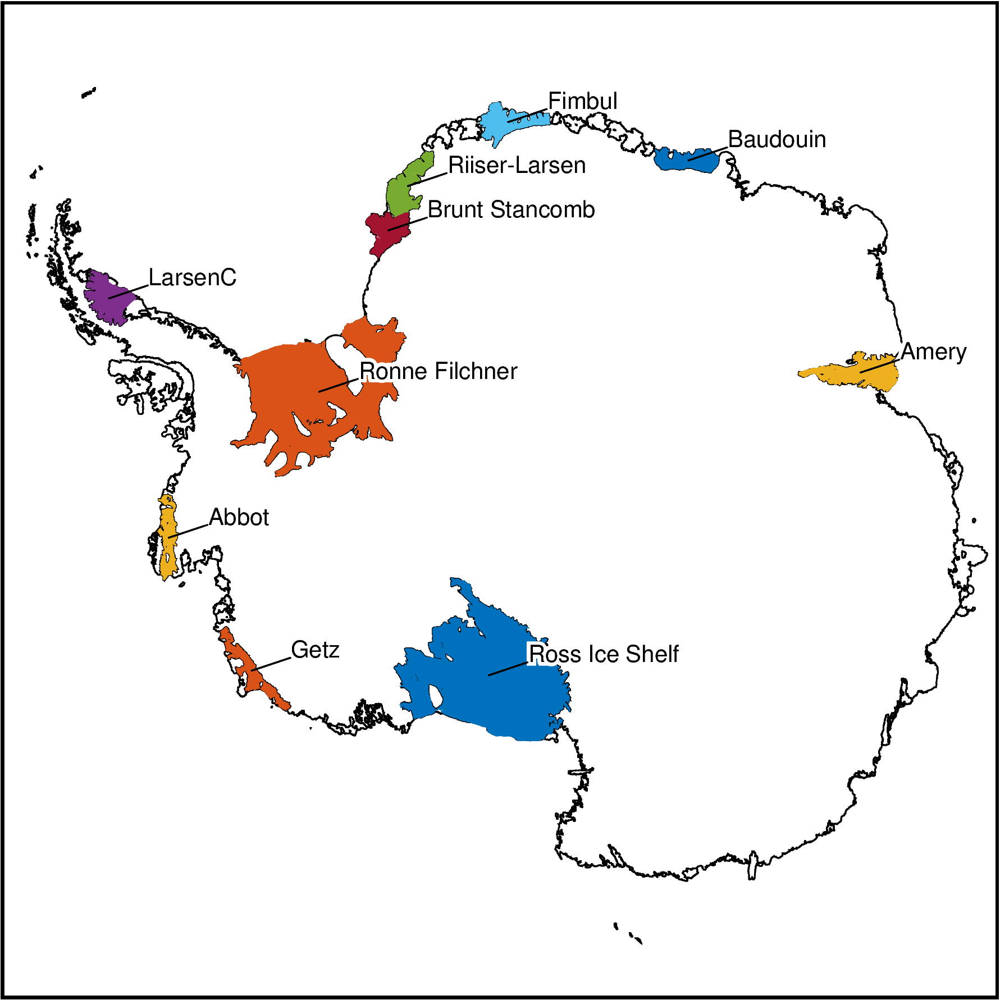

In [10]:
# choose how many ice shelves to plot
df = ice_shelves.iloc[0:10]

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    region=regions.antarctica,
    coast=True,
)

# plot ice shelves
fig.plot(
    df,
    close=True,
    fill="auto",
)

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)


fig.show()

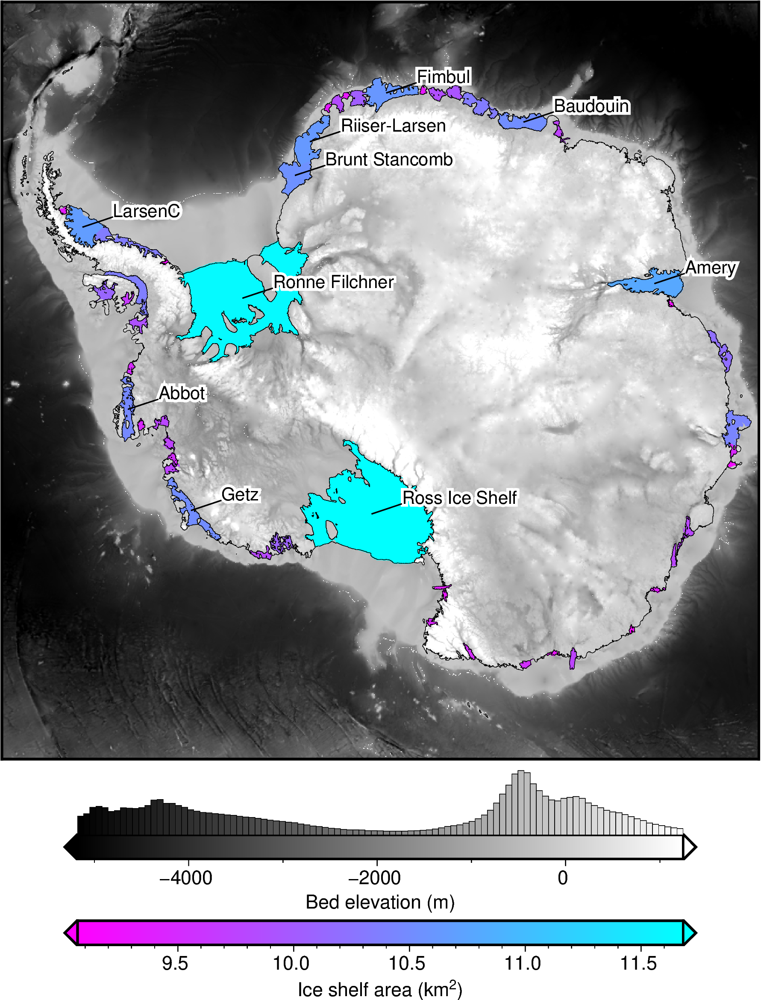

In [ ]:
df = ice_shelves.iloc[0:50].copy()

df["log_area"] = np.log10(df.area)

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="cool",
    reverse=True,
    series=utils.get_min_max(df.log_area),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial="Z=log_area",
    close=True,
    cmap=True,
)

# add colorbar with custom annotation values
# get even log-spaced values of colormap
log_values = np.linspace(df.log_area.min(), df.log_area.max(), 5)
# convert to area value rounded to nearest 1000
area_values = [int(round((10**x) / 1e6, -3)) for x in log_values]
# convert back to log-spaced values
log_values = [np.log10(x * 1e6) for x in area_values]
annots = [f"{loc} a {label}" for loc, label in zip(log_values, area_values)]
annots = "\n".join(annots)
with Path.open("../../plotting/tmp.txt", "w") as f:
    f.write(annots)

maps.add_colorbar(
    fig=fig,
    cbar_label="Ice shelf area (km@+2@+)",
    cbar_yoffset=3.2,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

# Ice mass change

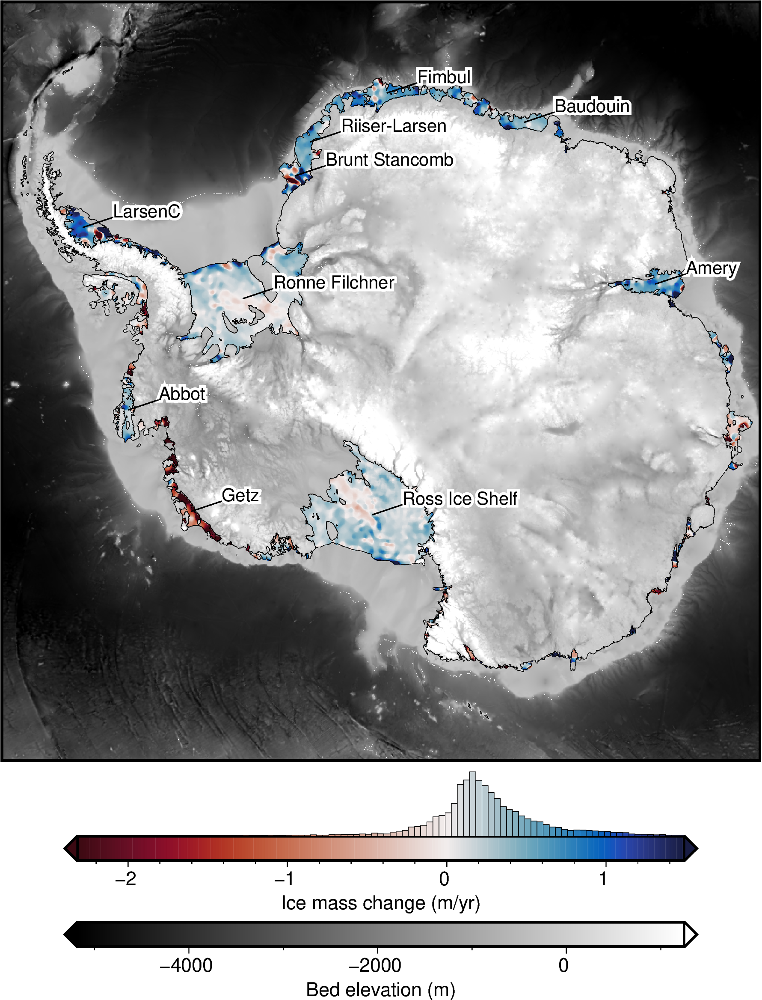

In [17]:
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    mass_change,
    fig=fig,
    origin_shift="no_shift",
    reverse_cpt=True,
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ice mass change (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

# Basal melt

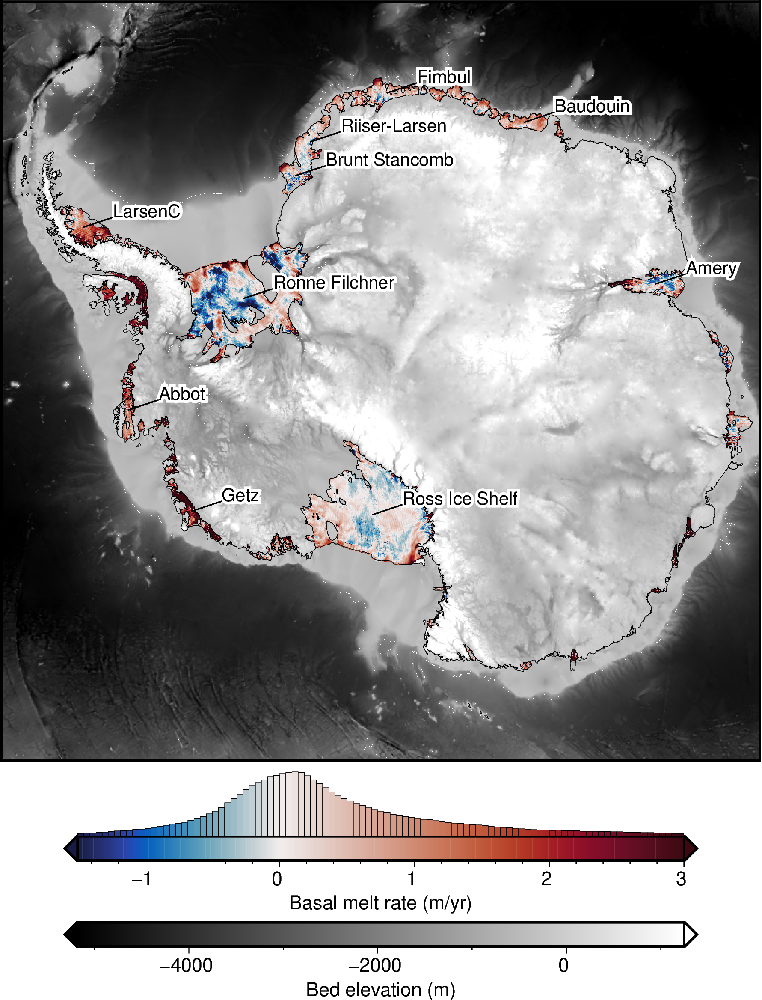

In [18]:
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

# Ice Shelf Ocean Draft (icebase to bed)

In [19]:
ocean_draft = icebase - bed

# ensure no negative thickness values
ocean_draft = xr.where(ocean_draft < 0, np.nan, ocean_draft)

# mask the ocean draft to ice shelves.
ocean_draft_masked = utils.mask_from_shp(
    shapefile=ice_shelves,
    xr_grid=ocean_draft,
    invert=False,
    masked=True,
)

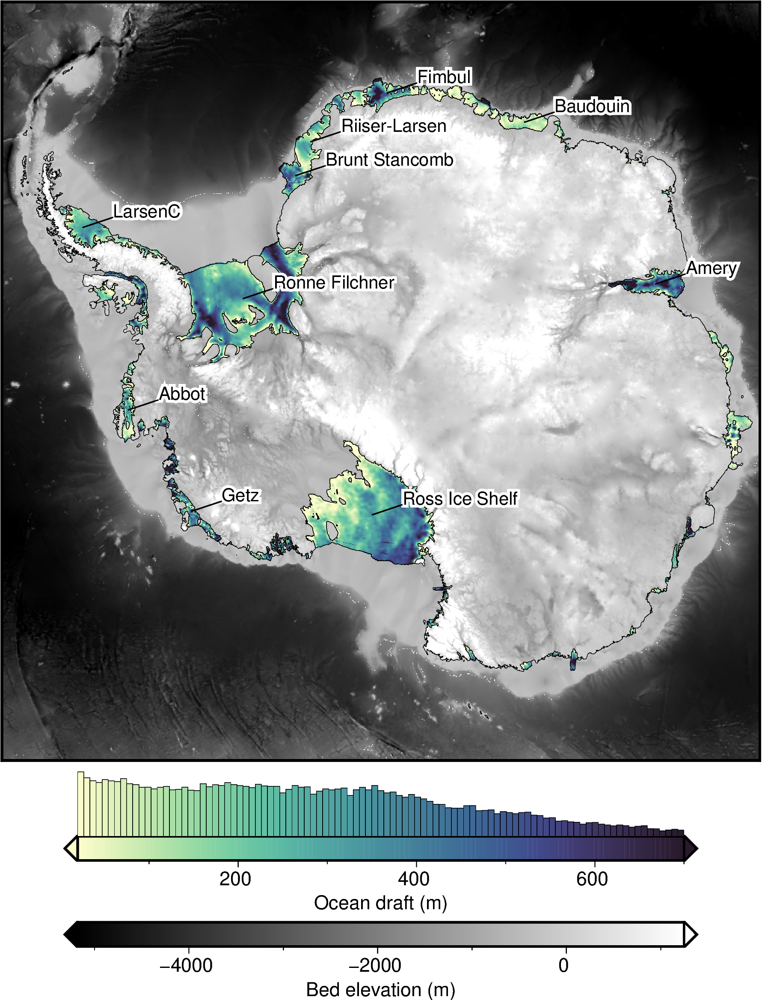

In [20]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot imagery and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=40,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    robust=True,
)

# plot imagery and coastline
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

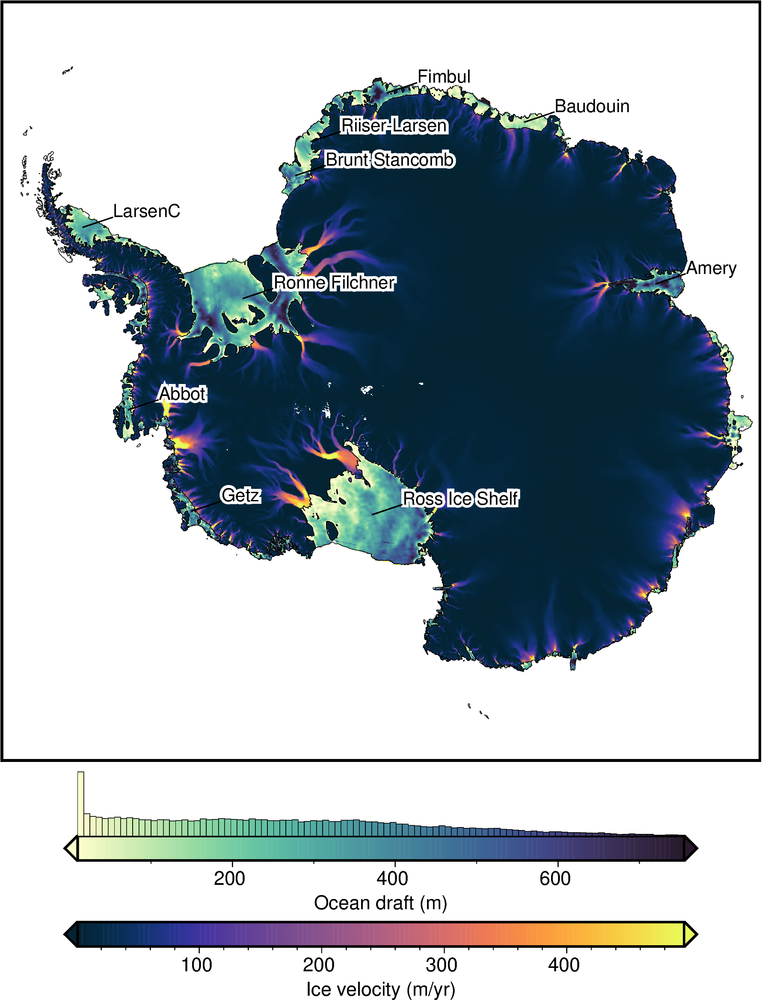

In [22]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:50].copy()

# plot ice velocity and coastline
lims = np.nanquantile(ice_vel, [0.04, 0.96])
fig = maps.plot_grd(
    ice_vel,
    cpt_lims=lims,
    cmap="thermal",
    fig_height=15,
    region=regions.antarctica,
    # transparency=40,
    cbar_yoffset=3.2,
    cbar_label="Ice velocity (m/yr)",
)

fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    robust=True,
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.show()

# Basal melt and ocean draft

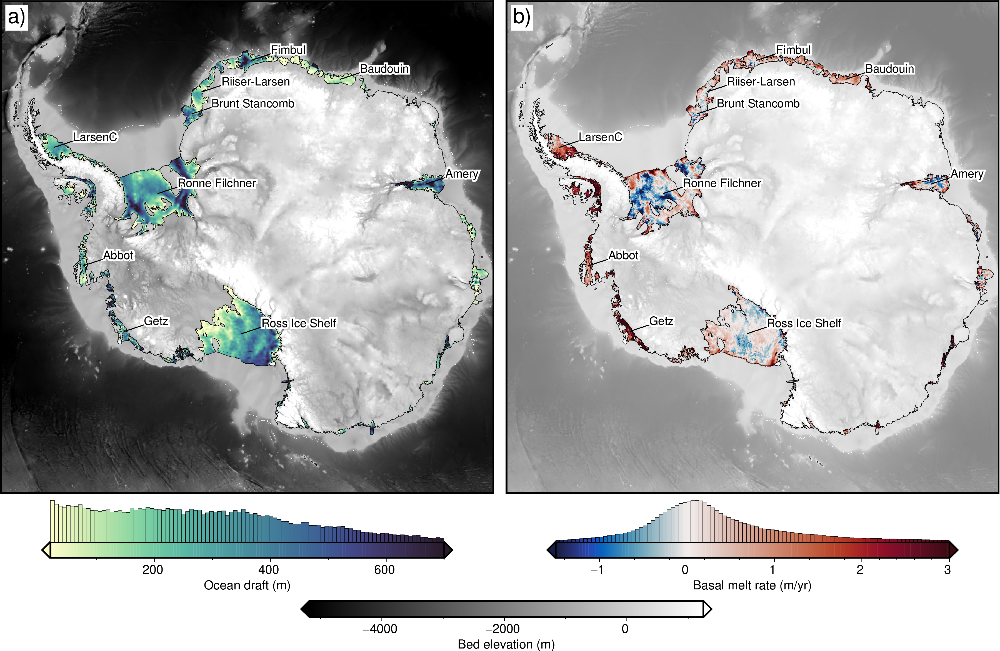

In [23]:
df = ice_shelves.iloc[0:50].copy()

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    # transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.2,
    cbar_xoffset=7.5,
    robust=True,
    colorbar=False,
)

# plot ocean draft
fig = maps.plot_grd(
    ocean_draft_masked,
    fig=fig,
    origin_shift="no_shift",
    cmap="deep",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Ocean draft (m)",
    hist=True,
    cbar_yoffset=1.5,
    cpt_lims=[20, 700],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.text(
    position="TL",
    justify="TL",
    text="a)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

# plot bed and coastline
fig = maps.plot_grd(
    bed,
    fig=fig,
    origin_shift="xshift",
    cmap="gray",
    fig_height=15,
    # shading=True,
    region=regions.antarctica,
    transparency=50,
    cbar_label="Bed elevation (m)",
    # hist=True,
    cbar_yoffset=3.3,
    cbar_xoffset=-7.5,
    robust=True,
)

# plot basal melt
fig = maps.plot_grd(
    basal_melt,
    fig=fig,
    origin_shift="no_shift",
    cmap="balance+h0",
    fig_height=15,
    region=regions.antarctica,
    cbar_label="Basal melt rate (m/yr)",
    hist=True,
    cbar_yoffset=1.5,
    # robust=True,
    cpt_lims=[-1.5, 3],
    frame=False,
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=10)

fig.text(
    position="TL",
    justify="TL",
    text="b)",
    fill="white",
    font="18p,Helvetica,black",
    offset="j.2c/.2c",
    no_clip=True,
)

fig.show()

## Get average ocean draft measurement for each shelf

In [29]:
# convert dataarray to dataframe, dropping rows with nans
df = vd.grid_to_table(ocean_draft.rename("draft")).dropna(how="any")
df = df.reset_index()
df

,index,y,x,draft
0,0,-3330000.0,-3330000.0,4741.268066
1,1,-3330000.0,-3325000.0,4838.791504
2,2,-3330000.0,-3320000.0,4827.084961
3,3,-3330000.0,-3315000.0,4746.930664
4,4,-3330000.0,-3310000.0,4711.509766
...,...,...,...,...
1585896,1776884,3330000.0,3310000.0,4106.803711
1585897,1776885,3330000.0,3315000.0,3994.813477
1585898,1776886,3330000.0,3320000.0,3855.186523
1585899,1776887,3330000.0,3325000.0,3807.816162


In [30]:
# turn draft data into geopandas geodataframe with points
ocean_draft_gpd = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(x=df.x, y=df.y), crs="3031"
)

# merge ocean draft point data and ice shelf polygons
merged = gpd.sjoin(ocean_draft_gpd, ice_shelves, how="left")

# get stats for each ice shelf
stats_pt = merged.groupby("NAME").agg(
    draft_mean=("draft", "mean"),
    draft_std=("draft", "std"),
    draft_max=("draft", "max"),
    draft_min=("draft", "min"),
)

# merge stats back into ice shelf gdf
ice_shelves = pd.merge(
    ice_shelves, stats_pt, left_on="NAME", right_index=True, how="outer"
)

ice_shelves.sort_values(by="draft_max", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
118,Borchgrevink,East,FL,"POLYGON ((673415.109 2122771.487, 672998.689 2...",2.161561e+10,262.029635,507.641554,2842.322108,5.470837
35,Brunt_Stancomb,East,FL,"POLYGON ((-648673.952 1612385.898, -648144.200...",3.613710e+10,344.890711,308.669032,2704.610712,6.555965
120,Fimbul,East,FL,"POLYGON ((145423.961 2176737.792, 145088.314 2...",4.094775e+10,385.207451,337.126312,2300.983350,5.182327
36,Riiser-Larsen,East,FL,"POLYGON ((-592166.317 1592824.258, -593783.160...",4.291314e+10,183.298686,170.946690,2249.772985,5.351669
114,Amery,East,FL,"POLYGON ((2134701.422 618463.117, 2131452.011 ...",6.079728e+10,444.364527,283.963113,1605.669800,2.455902


In [31]:
ice_shelves.sort_values(by="draft_min", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
166,Hummer_Point,Islands,FL,"POLYGON ((-1597171.359 -586925.122, -1597492.7...",2.897850e+07,448.093672,NaN,448.093672,448.093672
177,Hayes_Coats_Coast,East,FL,"POLYGON ((-699140.992 1331574.824, -699232.533...",1.171555e+07,337.689644,NaN,337.689644,337.689644
172,Eltanin_Bay,West,FL,"POLYGON ((-1765551.512 274938.583, -1764671.70...",8.060678e+06,277.896127,NaN,277.896127,277.896127
173,Alison,West,FL,"MULTIPOLYGON (((-1754722.344 256629.320, -1754...",4.771155e+07,224.574526,NaN,224.574526,224.574526
77,Campbell,East,FL,"POLYGON ((455747.567 -1617005.642, 455773.818 ...",6.948870e+07,178.382456,30.247813,199.770889,156.994022


In [32]:
ice_shelves.sort_values(by="draft_mean", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
55,Thwaites,West,FL,"POLYGON ((-1600077.739 -445017.920, -1599824.4...",5.377367e+09,596.877489,312.116804,1389.481323,6.434799
57,Dotson,West,FL,"POLYGON ((-1535033.641 -603663.519, -1523891.9...",5.677276e+09,549.453440,316.007009,1312.841320,8.203217
72,Drygalski,East,FL,"POLYGON ((471675.110 -1519675.151, 471799.885 ...",2.280856e+09,516.265363,326.898167,1156.178955,4.726288
97,Totten,East,FL,"POLYGON ((2246041.394 -1157675.447, 2239414.25...",6.187043e+09,499.414479,381.340502,1488.852592,13.441406
166,Hummer_Point,Islands,FL,"POLYGON ((-1597171.359 -586925.122, -1597492.7...",2.897850e+07,448.093672,NaN,448.093672,448.093672


In [33]:
ice_shelves.sort_values(by="draft_std", ascending=False).head()

,NAME,Regions,TYPE,geometry,area,draft_mean,draft_std,draft_max,draft_min
118,Borchgrevink,East,FL,"POLYGON ((673415.109 2122771.487, 672998.689 2...",2.161561e+10,262.029635,507.641554,2842.322108,5.470837
64,Sulzberger,West,FL,"POLYGON ((-661704.253 -1219812.221, -661564.09...",1.196952e+10,435.011796,382.795694,1598.266411,3.309071
97,Totten,East,FL,"POLYGON ((2246041.394 -1157675.447, 2239414.25...",6.187043e+09,499.414479,381.340502,1488.852592,13.441406
1,Philbin_Inlet,West,FL,"POLYGON ((-1597834.808 -706178.441, -1597353.9...",8.962356e+07,262.722687,364.747587,785.425381,9.967670
71,Nordenskjold,East,FL,"POLYGON ((451096.464 -1435650.283, 451815.537 ...",2.292620e+08,237.277866,344.591489,863.866315,7.037682


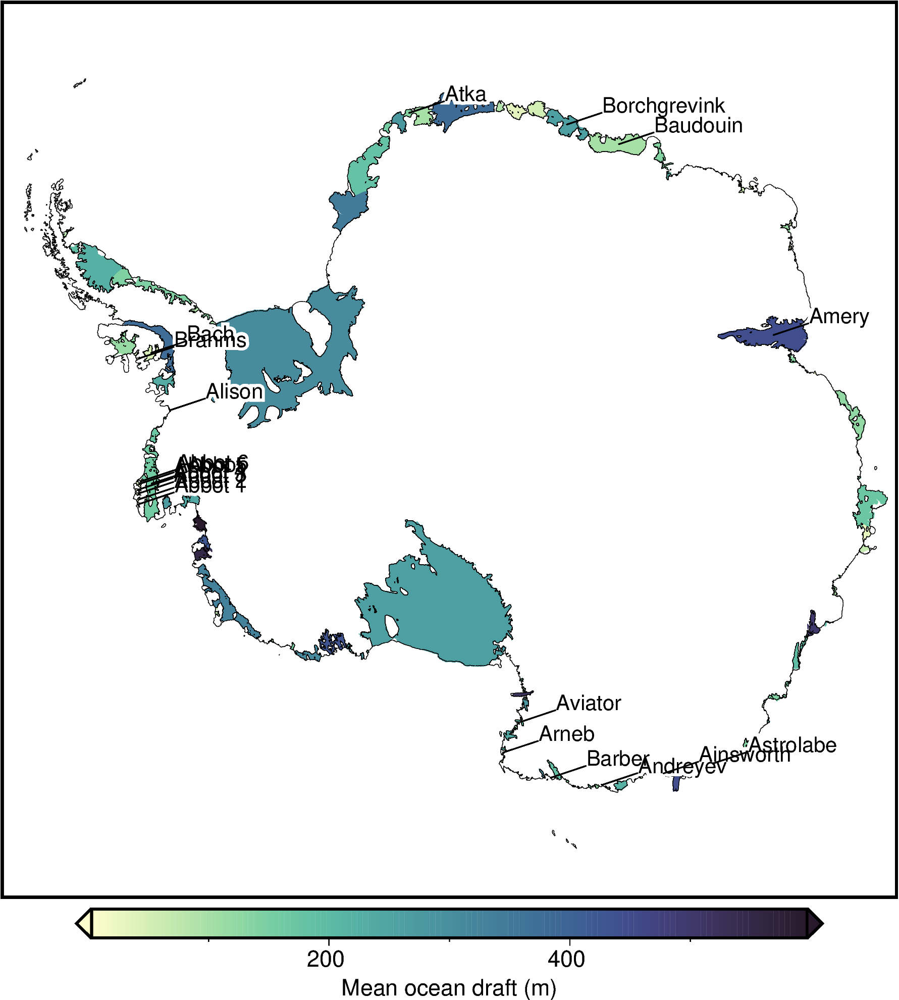

In [39]:
# choose how many ice shelves to plot, sorted by area
df = ice_shelves.iloc[0:].copy()

# plot imagery and coastline
# fig = maps.plot_grd(
#     bed,
#     cmap="gray",
#     fig_height=15,
#     # shading=True,
#     region=regions.antarctica,
#     transparency=40,
#     cbar_label="Bed elevation (m)",
#     hist=True,
#     cbar_yoffset=1.5,
#     robust=True,
# )

# plot basemap with coastline and grounding lines
fig = maps.basemap(
    fig_height=15,
    region=regions.antarctica,
    # coast=True,
)

# make colormap for ice shelf area
pygmt.makecpt(
    cmap="deep",
    series=utils.get_min_max(df.draft_mean),
    background="o",
)

# plot ice shelves
fig.plot(
    df,
    fill="+z",
    aspatial="Z=draft_mean",
    close=True,
    cmap=True,
)

maps.add_colorbar(
    fig=fig,
    cbar_label="Mean ocean draft (m)",
)

maps.add_coast(fig=fig, pen="0.2p,black")

# plot names
plot_ice_shelf_names(fig, ice_shelves, num=20)

fig.show()